In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
url = 'https://docs.google.com/spreadsheets/d/1HcdISgCl3s4RpWkJa8m-G1JjfKzd8qf2WY2Xcw32D7U/pub?gid=1371955398&single=true&output=csv'

In [3]:
import pandas
import re
from enum import Enum

class Character(Enum):
   
    def __ge__(self, other):
        if self.__class__ is other.__class__:
            return self.value >= other.value
        return NotImplemented
    def __gt__(self, other):
        if self.__class__ is other.__class__:
            return self.value > other.value
        return NotImplemented
    def __le__(self, other):
        if self.__class__ is other.__class__:
            return self.value <= other.value
        return NotImplemented
    def __lt__(self, other):
        if self.__class__ is other.__class__:
            return self.value < other.value
        return NotImplemented

    Gwen = 'gwen'
    Setsuki = 'setsuki'
    Troq = 'troq'
    DeGrey = 'degrey'
    Zane = 'zane'
    Midori = 'midori'
    Grave = 'grave'
    Geiger = 'geiger'
    Menelker = 'menelker'
    Lum = 'lum'
    Quince = 'quince'
    Rook = 'rook'
    BBB = 'bbb'
    Onimaru = 'onimaru'
    Vendetta = 'vendetta'
    Jaina = 'jaina'
    Argagarg = 'argagarg'
    Valerie = 'valerie'
    Persephone = 'persephone'
    Gloria = 'gloria'
    
for char in Character:
    locals()[char.name] = char
    
historical_record = pandas.read_csv(url)
historical_record.columns = [re.sub('\W+', '_', col.lower()).strip('_') for col in historical_record.columns]

historical_record = historical_record[
    ~historical_record.character_1.isin(['Squall', 'Kefka', 'Ultimicia']) &
    ~historical_record.character_2.isin(['Squall', 'Kefka', 'Ultimicia'])
]

historical_record.character_2.replace(to_replace=['variable'], value=['Gloria'], inplace=True)

names = pandas.DataFrame({'name': historical_record.player_1.append(historical_record.player_2)})
names['lower'] = names.apply(lambda r: r['name'].lower(), axis=1)
name_map = names.groupby('lower').first()

historical_record['match_date'] = pandas.to_datetime(historical_record.match_date, infer_datetime_format=True)
historical_record.format_restricted.replace(to_replace=['.', 'Restricted'], value=[False, True], inplace=True)
historical_record.format_team.replace(to_replace=['.', 'Team'], value=[False, True], inplace=True)
historical_record.char_select_random.replace(to_replace=['.', 'Random'], value=[False, True], inplace=True)
historical_record.char_select_locked.replace(to_replace=['.', 'Locked'], value=[False, True], inplace=True)
historical_record.set_length_non_ft3_ft4.replace(to_replace=['.', 'non-FT3/FT4'], value=[False, True], inplace=True)
historical_record.set_win_1 = historical_record.set_win_1.fillna(0)
historical_record.set_win_2 = historical_record.set_win_2.fillna(0)
historical_record.wins_1 = historical_record.wins_1.fillna(0)
historical_record.wins_2 = historical_record.wins_2.fillna(0)
historical_record.character_1 = historical_record.character_1.apply(lambda n: Character(n.lower()))
historical_record.character_2 = historical_record.character_2.apply(lambda n: Character(n.lower()))
historical_record.player_1 = historical_record.player_1.apply(lambda n: name_map.loc[n.lower()])
historical_record.player_2 = historical_record.player_2.apply(lambda n: name_map.loc[n.lower()])


In [4]:
from scipy.stats import norm
import math

def ci_bounds(pos, n, confidence):
    if n == 0:
        return (0, 0)
    z = norm.ppf(1-(1-confidence)/2)
    phat = 1.0*pos/n
    return (
        (phat + z*z/(2*n) - z * math.sqrt((phat*(1-phat)+z*z/(4*n))/n))/(1+z*z/n),
        (phat + z*z/(2*n) + z * math.sqrt((phat*(1-phat)+z*z/(4*n))/n))/(1+z*z/n),
    )


In [5]:
def pct_bounds(groups):
    wins = groups['wins', 'losses'].sum()

    wins['lower'] = wins.apply(lambda r: ci_bounds(r.wins, (r.wins + r.losses), 0.75)[0], axis=1)
    wins['upper'] = wins.apply(lambda r: ci_bounds(r.wins, (r.wins + r.losses), 0.75)[1], axis=1)
    
    return wins

In [6]:
matches = historical_record[[
    'character_1', 'wins_1',
    'wins_2', 'character_2',
]].append(
    historical_record[[
        'character_1', 'wins_1',
        'wins_2', 'character_2',
    ]].rename(columns={
        'character_1': 'character_2',
        'wins_1': 'wins_2',
        'character_2': 'character_1',
        'wins_2': 'wins_1',
    })
).rename(columns={
    'character_1': 'as_character',
    'wins_1': 'wins',
    'wins_2': 'losses',
    'character_2': 'against_character',
})


/home/cpennington/.virtualenvs/yomi-skill/lib/python3.6/site-packages/pandas/core/frame.py:6211: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)


In [7]:
character_ratings = pct_bounds(matches.groupby(['as_character', 'against_character']))

In [8]:
character_ratings['rate'] = character_ratings.wins / (character_ratings.wins + character_ratings.losses)

In [9]:
character_ratings

wins  losses     lower     upper  \
as_character       against_character                                         
Character.Argagarg Character.Argagarg     32.0    32.0  0.428835  0.571165   
                   Character.BBB          25.0    37.0  0.334306  0.476190   
                   Character.DeGrey       64.0    66.0  0.442200  0.542571   
                   Character.Geiger       57.0    59.0  0.438383  0.544570   
                   Character.Gloria       86.0   107.0  0.404949  0.486984   
                   Character.Grave       122.0   104.0  0.501563  0.577619   
                   Character.Gwen         59.0    38.0  0.550142  0.663439   
                   Character.Jaina        56.0    20.0  0.675040  0.790538   
                   Character.Lum          76.0    42.0  0.592023  0.692917   
                   Character.Menelker     43.0    33.0  0.499812  0.629515   
                   Character.Midori       63.0    47.0  0.517922  0.625804   
                   Character.Onimaru     113.0    62.0  0.603171  0.686071   
                   Character.Persephone   63.0    53.0  0.489711  0.595523   
                   Character.Quince       45.0    75.0  0.325784  0.426943   
                   Character.Rook        110.0    67.0  0.578776  0.662359   
                   Character.Setsuki      77.0    84.0  0.433335  0.523541   
                   Character.Troq         79.0    89.0  0.426347  0.514595   
                   Character.Valerie      76.0    66.0  0.486960  0.582812   
                   Character.Vendetta     75.0    73.0  0.459632  0.553762   
                   Character.Zane         59.0    90.0  0.350994  0.442784   
Character.BBB      Character.Argagarg     37.0    25.0  0.523810  0.665694   
                   Character.BBB          40.0    40.0  0.436219  0.563781   
                   Character.DeGrey       33.0    48.0  0.346582  0.471210   
                   Character.Geiger       16.0    34.0  0.249594  0.399688   
                   Character.Gloria       24.0    18.0  0.482730  0.655763   
                   Character.Grave        46.0    68.0  0.352051  0.457181   
                   Character.Gwen         48.0    50.0  0.432231  0.547633   
                   Character.Jaina        22.0    22.0  0.414564  0.585436   
                   Character.Lum          28.0    32.0  0.394097  0.540675   
                   Character.Menelker     15.0    15.0  0.397230  0.602770   
...                                        ...     ...       ...       ...   
Character.Vendetta Character.Midori       32.0    37.0  0.396039  0.532861   
                   Character.Onimaru      33.0    43.0  0.370485  0.500188   
                   Character.Persephone   31.0    28.0  0.450904  0.598828   
                   Character.Quince       43.0    47.0  0.417971  0.538229   
                   Character.Rook         65.0    62.0  0.460929  0.562450   
                   Character.Setsuki      39.0    54.0  0.362028  0.478945   
                   Character.Troq         49.0    47.0  0.451984  0.568566   
                   Character.Valerie      34.0    62.0  0.300346  0.411953   
                   Character.Vendetta     15.0    15.0  0.397230  0.602770   
                   Character.Zane         41.0    61.0  0.347716  0.458717   
Character.Zane     Character.Argagarg     90.0    59.0  0.557216  0.649006   
                   Character.BBB          48.0    29.0  0.558276  0.684308   
                   Character.DeGrey      153.0   121.0  0.523686  0.592541   
                   Character.Geiger      128.0    91.0  0.545771  0.622164   
                   Character.Gloria      132.0    82.0  0.577985  0.654223   
                   Character.Grave       145.0   108.0  0.537061  0.608423   
                   Character.Gwen         66.0    46.0  0.535071  0.641416   
                   Character.Jaina        50.0    25.0  0.601638  0.725916   
                   Character.Lum          56.0    49.0  0.477260

In [10]:
median_rates = character_ratings.groupby('as_character').rate.median()

In [11]:
median_rates.sort_values()

as_character
Character.Jaina         0.430952
Character.Persephone    0.449495
Character.Valerie       0.463876
Character.Rook          0.471203
Character.Vendetta      0.485511
Character.Menelker      0.491422
Character.Quince        0.492424
Character.Gwen          0.495283
Character.BBB           0.500000
Character.Gloria        0.500000
Character.Grave         0.500000
Character.Onimaru       0.500000
Character.Setsuki       0.501613
Character.Midori        0.503623
Character.Argagarg      0.520984
Character.Lum           0.522600
Character.Geiger        0.535487
Character.DeGrey        0.536221
Character.Troq          0.540177
Character.Zane          0.577500
Name: rate, dtype: float64

In [12]:
from plotnine import *
from pandas.api.types import CategoricalDtype

df = character_ratings.reset_index()

character_list = df.groupby('as_character').rate.sum().sort_values().index.tolist()
char_cat = CategoricalDtype(categories=character_list, ordered=True)
df['char_cat'] = df.as_character.astype(char_cat)

(
    ggplot(df, aes(x='char_cat', y='rate'))
    + geom_violin()
    + coord_flip()
)

<Figure size 640x480 with 1 Axes>

<ggplot: (-9223363264538638213)>

In [26]:
import nashpy

game = nashpy.Game(character_ratings.rate.unstack().values-0.5)

In [66]:
equilibria = game.lemke_howson_enumeration()

pandas.DataFrame.from_records(
    dict(zip(Character, eq[0]))
    for eq in equilibria
    if (eq[0] >= 0).all()
)

/home/cpennington/.virtualenvs/yomi-skill/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in greater_equal
  


,Character.Argagarg,Character.BBB,Character.DeGrey,Character.Geiger,Character.Gloria,Character.Grave,Character.Gwen,Character.Jaina,Character.Lum,Character.Menelker,Character.Midori,Character.Onimaru,Character.Persephone,Character.Quince,Character.Rook,Character.Setsuki,Character.Troq,Character.Valerie,Character.Vendetta,Character.Zane
0,0.357247,0.0,0.517449,0.0,0.125305,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
1,0.357247,0.0,0.517449,0.0,0.125305,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
2,0.357247,0.0,0.517449,0.0,0.125305,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
3,0.357247,0.0,0.517449,0.0,0.125305,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
4,0.357247,0.0,0.517449,0.0,0.125305,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
5,0.093832,0.0,0.000000,0.0,NaN,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.15864,0.0,0.0,0.0,0.0,0.747529,0.0,0.0
6,0.357247,0.0,0.517449,0.0,0.125305,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
7,0.357247,0.0,0.517449,0.0,0.125305,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
8,0.357247,0.0,0.517449,0.0,0.125305,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
9,0.357247,0.0,0.517449,0.0,0.125305,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0


In [69]:
class RandomStable:
    def __init__(self, win_probs):
        self.win_probs = win_probs
        self.cache = {}

    def random_stable(self, p1, p2):
        return self._random_stable(frozenset(p1), frozenset(p2), frozenset(), frozenset())

    def _random_stable(self, p1_active, p2_active, p1_inactive, p2_inactive):
        cache_key = (p1_active, p2_active, p1_inactive, p2_inactive)
        if cache_key in self.cache:
            return self.cache[cache_key]
    
        if not p1_active:
            if p1_inactive:
                return self._random_stable(p1_inactive, p2_active, frozenset(), p2_inactive)
            else:
                return 1
        if not p2_active:
            if p2_inactive:
                return self._random_stable(p1_active, p2_inactive, p1_inactive, frozenset())
            else:
                return 0

        matchups = [(p1, p2) for p1 in p1_active for p2 in p2_active]
        matchup_probs = []
        for (p1, p2) in matchups:
            p1_wins = self._random_stable(p1_active - {p1}, p2_active - {p2}, p1_inactive, p2_inactive | {p2})
            p2_wins = self._random_stable(p1_active - {p1}, p2_active - {p2}, p1_inactive | {p1}, p2_inactive)
            matchup_probs.append(self.win_probs[p1][p2] * p1_wins + (1-self.win_probs[p1][p2]) * p2_wins)

        matchup_sum = sum(matchup_probs)
        self.cache[cache_key] = matchup_sum/len(matchups) 
        return self.cache[cache_key]

In [84]:
from sympy import *
symbols = {p1: {p2: symbols(f"P{p1}{p2}") for p2 in range(3)} for p1 in range(3)}
symbolic_stable = RandomStable(symbols)
simplified = simplify(symbolic_stable.random_stable(range(3), range(3)))
fast_3_stable = lambdify(flatten(list(d.values()) for d in symbols.values()), simplified)

In [97]:
%load_ext Cython

In [104]:
%%cython
def fast_3_stable_cy(P00, P01, P02, P10, P11, P12, P20, P21, P22):
    return P00*P01*P02*P10*P21/6 + P00*P01*P02*P10*P22/6 + P00*P01*P02*P11*P20/6 + P00*P01*P02*P11*P22/6 + P00*P01*P02*P12*P20/6 + P00*P01*P02*P12*P21/6 + P00*P01*P10*P12*P20/6 + P00*P01*P10*P20*P22/6 - P00*P01*P10*P20/3 - P00*P01*P10*P21/6 - P00*P01*P10*P22/6 + P00*P01*P11*P12*P21/6 - P00*P01*P11*P20/6 + P00*P01*P11*P21*P22/6 - P00*P01*P11*P21/3 - P00*P01*P11*P22/6 - P00*P01*P12*P20/6 - P00*P01*P12*P21/6 + P00*P02*P10*P11*P20/6 + P00*P02*P10*P20*P21/6 - P00*P02*P10*P20/3 - P00*P02*P10*P21/6 - P00*P02*P10*P22/6 + P00*P02*P11*P12*P22/6 - P00*P02*P11*P20/6 - P00*P02*P11*P22/6 - P00*P02*P12*P20/6 + P00*P02*P12*P21*P22/6 - P00*P02*P12*P21/6 - P00*P02*P12*P22/3 + P00*P10*P11*P12*P21/6 + P00*P10*P11*P12*P22/6 + P00*P10*P11*P20*P22/6 - P00*P10*P11*P20/3 - P00*P10*P11*P21/6 - P00*P10*P11*P22/6 + P00*P10*P12*P20*P21/6 - P00*P10*P12*P20/3 - P00*P10*P12*P21/6 - P00*P10*P12*P22/6 - P00*P10*P20*P21/3 - P00*P10*P20*P22/3 + P00*P10*P20 + P00*P10*P21/3 + P00*P10*P22/3 - P00*P11*P12*P21/6 - P00*P11*P12*P22/6 + P00*P11*P20*P21*P22/6 - P00*P11*P20*P21/6 - P00*P11*P20*P22/6 + P00*P11*P20/3 - P00*P11*P21*P22/6 + P00*P11*P21/3 + P00*P11*P22/6 + P00*P12*P20*P21*P22/6 - P00*P12*P20*P21/6 - P00*P12*P20*P22/6 + P00*P12*P20/3 - P00*P12*P21*P22/6 + P00*P12*P21/6 + P00*P12*P22/3 + P01*P02*P10*P11*P21/6 + P01*P02*P10*P12*P22/6 - P01*P02*P10*P21/6 - P01*P02*P10*P22/6 + P01*P02*P11*P20*P21/6 - P01*P02*P11*P20/6 - P01*P02*P11*P21/3 - P01*P02*P11*P22/6 + P01*P02*P12*P20*P22/6 - P01*P02*P12*P20/6 - P01*P02*P12*P21/6 - P01*P02*P12*P22/3 + P01*P10*P11*P12*P20/6 + P01*P10*P11*P12*P22/6 - P01*P10*P11*P20/6 + P01*P10*P11*P21*P22/6 - P01*P10*P11*P21/3 - P01*P10*P11*P22/6 - P01*P10*P12*P20/6 - P01*P10*P12*P22/6 + P01*P10*P20*P21*P22/6 - P01*P10*P20*P21/6 - P01*P10*P20*P22/6 + P01*P10*P20/3 - P01*P10*P21*P22/6 + P01*P10*P21/3 + P01*P10*P22/6 + P01*P11*P12*P20*P21/6 - P01*P11*P12*P20/6 - P01*P11*P12*P21/3 - P01*P11*P12*P22/6 - P01*P11*P20*P21/3 + P01*P11*P20/3 - P01*P11*P21*P22/3 + P01*P11*P21 + P01*P11*P22/3 + P01*P12*P20*P21*P22/6 - P01*P12*P20*P21/6 - P01*P12*P20*P22/6 + P01*P12*P20/6 - P01*P12*P21*P22/6 + P01*P12*P21/3 + P01*P12*P22/3 + P02*P10*P11*P12*P20/6 + P02*P10*P11*P12*P21/6 - P02*P10*P11*P20/6 - P02*P10*P11*P21/6 - P02*P10*P12*P20/6 + P02*P10*P12*P21*P22/6 - P02*P10*P12*P21/6 - P02*P10*P12*P22/3 + P02*P10*P20*P21*P22/6 - P02*P10*P20*P21/6 - P02*P10*P20*P22/6 + P02*P10*P20/3 - P02*P10*P21*P22/6 + P02*P10*P21/6 + P02*P10*P22/3 + P02*P11*P12*P20*P22/6 - P02*P11*P12*P20/6 - P02*P11*P12*P21/6 - P02*P11*P12*P22/3 + P02*P11*P20*P21*P22/6 - P02*P11*P20*P21/6 - P02*P11*P20*P22/6 + P02*P11*P20/6 - P02*P11*P21*P22/6 + P02*P11*P21/3 + P02*P11*P22/3 - P02*P12*P20*P22/3 + P02*P12*P20/3 - P02*P12*P21*P22/3 + P02*P12*P21/3 + P02*P12*P22

In [114]:
def fast_3_stable_simple(P00, P01, P02, P10, P11, P12, P20, P21, P22):
    return P00*P01*P02*P10*P21/6 + P00*P01*P02*P10*P22/6 + P00*P01*P02*P11*P20/6 + P00*P01*P02*P11*P22/6 + P00*P01*P02*P12*P20/6 + P00*P01*P02*P12*P21/6 + P00*P01*P10*P12*P20/6 + P00*P01*P10*P20*P22/6 - P00*P01*P10*P20/3 - P00*P01*P10*P21/6 - P00*P01*P10*P22/6 + P00*P01*P11*P12*P21/6 - P00*P01*P11*P20/6 + P00*P01*P11*P21*P22/6 - P00*P01*P11*P21/3 - P00*P01*P11*P22/6 - P00*P01*P12*P20/6 - P00*P01*P12*P21/6 + P00*P02*P10*P11*P20/6 + P00*P02*P10*P20*P21/6 - P00*P02*P10*P20/3 - P00*P02*P10*P21/6 - P00*P02*P10*P22/6 + P00*P02*P11*P12*P22/6 - P00*P02*P11*P20/6 - P00*P02*P11*P22/6 - P00*P02*P12*P20/6 + P00*P02*P12*P21*P22/6 - P00*P02*P12*P21/6 - P00*P02*P12*P22/3 + P00*P10*P11*P12*P21/6 + P00*P10*P11*P12*P22/6 + P00*P10*P11*P20*P22/6 - P00*P10*P11*P20/3 - P00*P10*P11*P21/6 - P00*P10*P11*P22/6 + P00*P10*P12*P20*P21/6 - P00*P10*P12*P20/3 - P00*P10*P12*P21/6 - P00*P10*P12*P22/6 - P00*P10*P20*P21/3 - P00*P10*P20*P22/3 + P00*P10*P20 + P00*P10*P21/3 + P00*P10*P22/3 - P00*P11*P12*P21/6 - P00*P11*P12*P22/6 + P00*P11*P20*P21*P22/6 - P00*P11*P20*P21/6 - P00*P11*P20*P22/6 + P00*P11*P20/3 - P00*P11*P21*P22/6 + P00*P11*P21/3 + P00*P11*P22/6 + P00*P12*P20*P21*P22/6 - P00*P12*P20*P21/6 - P00*P12*P20*P22/6 + P00*P12*P20/3 - P00*P12*P21*P22/6 + P00*P12*P21/6 + P00*P12*P22/3 + P01*P02*P10*P11*P21/6 + P01*P02*P10*P12*P22/6 - P01*P02*P10*P21/6 - P01*P02*P10*P22/6 + P01*P02*P11*P20*P21/6 - P01*P02*P11*P20/6 - P01*P02*P11*P21/3 - P01*P02*P11*P22/6 + P01*P02*P12*P20*P22/6 - P01*P02*P12*P20/6 - P01*P02*P12*P21/6 - P01*P02*P12*P22/3 + P01*P10*P11*P12*P20/6 + P01*P10*P11*P12*P22/6 - P01*P10*P11*P20/6 + P01*P10*P11*P21*P22/6 - P01*P10*P11*P21/3 - P01*P10*P11*P22/6 - P01*P10*P12*P20/6 - P01*P10*P12*P22/6 + P01*P10*P20*P21*P22/6 - P01*P10*P20*P21/6 - P01*P10*P20*P22/6 + P01*P10*P20/3 - P01*P10*P21*P22/6 + P01*P10*P21/3 + P01*P10*P22/6 + P01*P11*P12*P20*P21/6 - P01*P11*P12*P20/6 - P01*P11*P12*P21/3 - P01*P11*P12*P22/6 - P01*P11*P20*P21/3 + P01*P11*P20/3 - P01*P11*P21*P22/3 + P01*P11*P21 + P01*P11*P22/3 + P01*P12*P20*P21*P22/6 - P01*P12*P20*P21/6 - P01*P12*P20*P22/6 + P01*P12*P20/6 - P01*P12*P21*P22/6 + P01*P12*P21/3 + P01*P12*P22/3 + P02*P10*P11*P12*P20/6 + P02*P10*P11*P12*P21/6 - P02*P10*P11*P20/6 - P02*P10*P11*P21/6 - P02*P10*P12*P20/6 + P02*P10*P12*P21*P22/6 - P02*P10*P12*P21/6 - P02*P10*P12*P22/3 + P02*P10*P20*P21*P22/6 - P02*P10*P20*P21/6 - P02*P10*P20*P22/6 + P02*P10*P20/3 - P02*P10*P21*P22/6 + P02*P10*P21/6 + P02*P10*P22/3 + P02*P11*P12*P20*P22/6 - P02*P11*P12*P20/6 - P02*P11*P12*P21/6 - P02*P11*P12*P22/3 + P02*P11*P20*P21*P22/6 - P02*P11*P20*P21/6 - P02*P11*P20*P22/6 + P02*P11*P20/6 - P02*P11*P21*P22/6 + P02*P11*P21/3 + P02*P11*P22/3 - P02*P12*P20*P22/3 + P02*P12*P20/3 - P02*P12*P21*P22/3 + P02*P12*P21/3 + P02*P12*P22

In [121]:
rating_dict = character_ratings.rate.to_dict()

In [122]:
def fast_3_stable_teams(team1, team2):
    return fast_3_stable_simple(*[rating_dict[(p1,p2)] for (i1, p1) in enumerate(team1) for (i2, p2) in enumerate(team2)])

In [86]:
rate_stables = RandomStable(character_ratings.rate)

In [100]:
%timeit fast_3_stable_teams((Geiger, Troq, Zane), (Persephone, BBB, Setsuki))

1.75 ms ± 137 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


In [106]:
%timeit fast_3_stable_teams((Geiger, Troq, Zane), (Persephone, BBB, Setsuki))

1.62 ms ± 11.3 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


In [123]:
%timeit fast_3_stable_teams((Geiger, Troq, Zane), (Persephone, BBB, Setsuki))

14.9 µs ± 495 ns per loop (mean ± std. dev. of 7 runs, 100000 loops each)


In [129]:
%%prun -s cumulative -q -l 10 -T prun0
import itertools

teams = list(itertools.combinations(Character, 3))
data = []
for ix, (team1, team2) in enumerate((team1, team2) for team1 in teams for team2 in teams):
    if ix % 50000 == 0:
        print(f"Processing combination {ix}")

    data.append({'as': team1, 'against': team2, 'rate': fast_3_stable_teams(team1, team2)})
    
team_ratings = pandas.DataFrame.from_records(data)

Processing combination 0
Processing combination 50000
Processing combination 100000
Processing combination 150000
Processing combination 200000
Processing combination 250000
Processing combination 300000
Processing combination 350000
Processing combination 400000
Processing combination 450000
Processing combination 500000
Processing combination 550000
Processing combination 600000
Processing combination 650000
Processing combination 700000
Processing combination 750000
Processing combination 800000
Processing combination 850000
Processing combination 900000
Processing combination 950000
Processing combination 1000000
Processing combination 1050000
Processing combination 1100000
Processing combination 1150000
Processing combination 1200000
Processing combination 1250000
 
*** Profile printout saved to text file 'prun0'. 


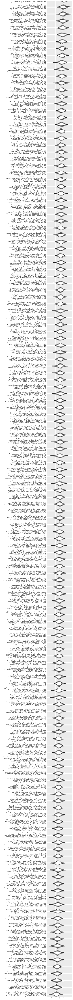

<ggplot: (-9223363264548935799)>

In [134]:
df = team_ratings.reset_index()

team_list = df.groupby('as').rate.sum().sort_values().index.tolist()
team_cat = CategoricalDtype(categories=team_list, ordered=True)
df['team_cat'] = df['as'].astype(team_cat)

(
    ggplot(df, aes(x='team_cat', y='rate'))
    + geom_violin()
    + coord_flip()
    + theme(figure_size=(5, 200))
)

In [131]:
team_ratings['as'] = team_ratings['as'].apply(lambda x: tuple(sorted(x)))
team_ratings['against'] = team_ratings['against'].apply(lambda x: tuple(sorted(x)))

In [132]:
team_ratings.set_index(['as', 'against'], inplace=True)

In [144]:
team_ratings.loc[(Onimaru, Rook, Troq)].rate.mean()

0.5251510144053383

In [135]:
import nashpy

team_game = nashpy.Game(team_ratings.rate.unstack().values-0.5)

In [139]:
team_game.lemke_howson(initial_dropped_label=0)

/home/cpennington/.virtualenvs/yomi-skill/lib/python3.6/site-packages/nashpy/integer_pivoting/integer_pivoting.py:27: RuntimeWarning: invalid value encountered in true_divide
  return np.argmax(tableau[:, column_index] / tableau[:, -1])
/home/cpennington/.virtualenvs/yomi-skill/lib/python3.6/site-packages/nashpy/algorithms/lemke_howson.py:54: RuntimeWarning: invalid value encountered in true_divide
  return strategy / sum(strategy)
/home/cpennington/.virtualenvs/yomi-skill/lib/python3.6/site-packages/nashpy/algorithms/lemke_howson.py:113: RuntimeWarning: The Lemke Howson algorithm has returned probability vectors of 
incorrect shapes. This indicates an error. Your game could be degenerate.
  warnings.warn(msg, RuntimeWarning)


(array([ 0.00032947,  0.00048435,  0.0003594 , ...,  0.00871381,
        -0.00810165,  0.00159276]), array([nan, nan, nan, nan]))

In [140]:
equilibria = team_game.support_enumeration()

for eq in equilibria:
    print(eq)
    break
# pandas.DataFrame.from_records(
#     dict(zip(team_list, eq[0]))
#     for eq in equilibria
#     if (eq[0] >= 0).all()
# )

KeyboardInterrupt: 